# Is Cluster 11 enriched for apoptotic genes?

Cluster 11 is definately made up of germ cells, but it has some strange properties. First it is not present in replicate 1. Most metrics would say cluster 11 is similar to mid germ cells, but x2a would suggest that it is similar to late germ cells. We are wondering if it could be a set of apoptotic cells, it is known that around 10% of germ cells end up going through apoptosis (Yacobi-Sharon2013-bt). 

In [65]:
import os
import sys
from pathlib import Path
import re

from IPython.display import display, HTML, Markdown, Image
import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from goatools.godag_plot import plot_results

# Project level imports
from larval_gonad.notebook import Nb
from larval_gonad.gene_ontology import run_fly, run_flyslim, go_wordcloud

In [3]:
# Setup notebook
nbconfig = Nb.setup_notebook(seurat_dir='../output/scrnaseq-wf/scrnaseq_combine_force')

last updated: 2018-07-20 
Git hash: 7c8c792fe0d550e6bb98dd08efade8f1a2738b41


In [12]:
background = nbconfig.seurat.get_normalized_read_counts().index.unique().tolist()

## Cluster 11 Biomarkers

In [4]:
biomarkers = nbconfig.seurat.get_biomarkers('res.0.6')

In [8]:
cluster11 = biomarkers.query('cluster == 11 & p_val_adj <= 0.01').copy()

### Full GO

In [173]:
results = run_fly(cluster11.index.tolist(), background, cutoff=0.05)

fisher module not installed.  Falling back on scipy.stats.fisher_exact
11,166 out of 14,476 population items found in association
Calculating uncorrected p-values using fisher_scipy_stats
 1,410 out of  1,805 study items found in association
Running multitest correction: statsmodels fdr_bh
  1,708 GO terms are associated with 1,410 of 1,805 study items
  7,609 GO terms are associated with 11,166 of 14,476 population items


GO:0030150 protein import into mitochondrial matrix 18
GO:0006626 protein targeting to mitochondrion 18
GO:0007186 G-protein coupled receptor signaling pathway 0
GO:0006355 regulation of transcription, DNA-templated 9
GO:0007476 imaginal disc-derived wing morphogenesis 0
GO:0007411 axon guidance 4
GO:0040003 chitin-based cuticle development 1
GO:0006412 translation 4
GO:0007165 signal transduction 3
GO:0043248 proteasome assembly 9
GO:0007606 sensory perception of chemical stimulus 0
GO:0007419 ventral cord development 0
GO:0007391 dorsal closure 1
GO:0000381 regulation of alternative mRNA splicing, via spliceosome 0
GO:0045892 negative regulation of transcription, DNA-templated 2
GO:0000122 negative regulation of transcription by RNA polymerase II 4
GO:0030707 ovarian follicle cell development 1
GO:0045944 positive regulation of transcription by RNA polymerase II 10
GO:0048477 oogenesis 10
GO:0001745 compound eye morphogenesis 1
GO:0008340 determination of adult lifespan 6
GO:0048813 

Text(0.5,1,'Full Biomarkers')

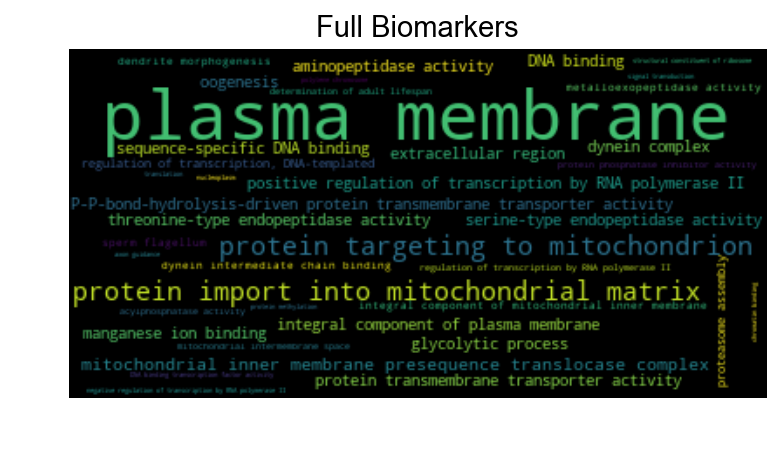

In [174]:
ax = go_wordcloud(results)
ax.set_title('Full Biomarkers')

In [175]:
plot_results('/tmp/biomarkers_res.png', goea_results=results)
Image('/tmp/biomarkers_res.png')

   73 usr 409 GOs  WROTE: /tmp/biomarkers_res.png


### Slim Go

In [176]:
resslim = run_flyslim(cluster11.index.tolist(), background, cutoff=0.05)

fisher module not installed.  Falling back on scipy.stats.fisher_exact
11,166 out of 14,476 population items found in association
Calculating uncorrected p-values using fisher_scipy_stats
 1,410 out of  1,805 study items found in association
Running multitest correction: statsmodels fdr_bh
  128 GO terms are associated with 1,410 of 1,805 study items
  143 GO terms are associated with 11,166 of 14,476 population items


GO:0006629 lipid metabolic process 18
GO:0040007 growth 5
GO:0002376 immune system process 9
GO:0007267 cell-cell signaling 17
GO:0048870 cell motility 13
GO:0006412 translation 7
GO:0007155 cell adhesion 4
GO:0000902 cell morphogenesis 2
GO:0040011 locomotion 4
GO:0006397 mRNA processing 13
GO:0030154 cell differentiation 10
GO:0034330 cell junction organization 1
GO:0006259 DNA metabolic process 16
GO:0008283 cell proliferation 5
GO:0006399 tRNA metabolic process 4
GO:0000278 mitotic cell cycle 8
GO:0043473 pigmentation 1
GO:0000003 reproduction 10
GO:0008219 cell death 10
GO:0006520 cellular amino acid metabolic process 8
GO:0022618 ribonucleoprotein complex assembly 5
GO:0051301 cell division 8
GO:0019748 secondary metabolic process 3
GO:0021700 developmental maturation 2
GO:0030198 extracellular matrix organization 0
GO:0006790 sulfur compound metabolic process 7
GO:0005886 plasma membrane 20
GO:0005576 extracellular region 11
GO:0005840 ribosome 0
GO:0005694 chromosome 4
GO:00056

Text(0.5,1,'Slim Biomarkers')

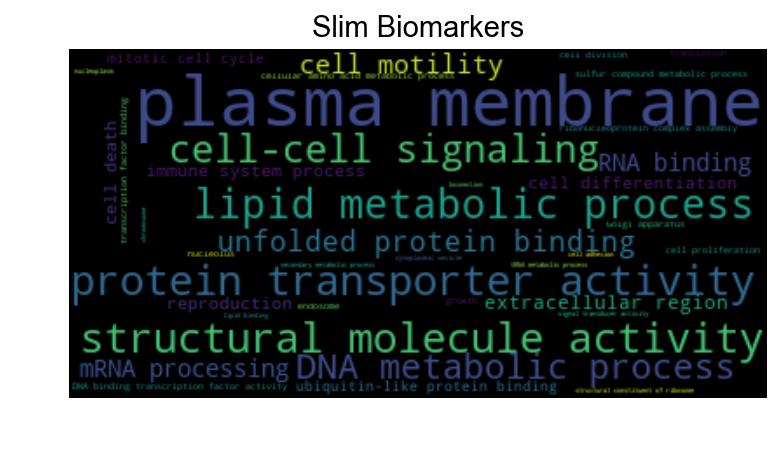

In [177]:
ax = go_wordcloud(resslim)
ax.set_title('Slim Biomarkers')

In [178]:
plot_results('/tmp/biomarkers_resslim.png', goea_results=results)
Image('/tmp/biomarkers_resslim.png')

   73 usr 409 GOs  WROTE: /tmp/biomarkers_resslim.png


## Genes up in Cluster 11 vs Gonia

In [179]:
gonia11 = pd.read_csv('../output/2018-07-13_scrnaseq_11_vs_germcells_biomarkers.tsv', sep='\t', index_col=0)

In [180]:
clus11 = gonia11.query('avg_logFC > 0 & p_val_adj <= 0.01').index.tolist()
gonia = gonia11.query('avg_logFC < 0 & p_val_adj <= 0.01').index.tolist()

### Full Cluster 11

In [187]:
full = run_fly(clus11, background, cutoff=0.05)

fisher module not installed.  Falling back on scipy.stats.fisher_exact
11,166 out of 14,476 population items found in association
Calculating uncorrected p-values using fisher_scipy_stats
   756 out of    968 study items found in association
Running multitest correction: statsmodels fdr_bh
  972 GO terms are associated with 756 of 968 study items
  7,609 GO terms are associated with 11,166 of 14,476 population items


GO:0030150 protein import into mitochondrial matrix 12
GO:0006626 protein targeting to mitochondrion 11
GO:0006355 regulation of transcription, DNA-templated 3
GO:0045944 positive regulation of transcription by RNA polymerase II 2
GO:0006096 glycolytic process 8
GO:0000122 negative regulation of transcription by RNA polymerase II 0
GO:0007411 axon guidance 1
GO:0007186 G-protein coupled receptor signaling pathway 0
GO:0005886 plasma membrane 6
GO:0005887 integral component of plasma membrane 5
GO:0030286 dynein complex 9
GO:0005744 mitochondrial inner membrane presequence translocase complex 8
GO:0005576 extracellular region 8
GO:0005515 protein binding 18
GO:0008320 protein transmembrane transporter activity 9
GO:0003677 DNA binding 4
GO:0015450 P-P-bond-hydrolysis-driven protein transmembrane transporter activity 9
GO:0003700 DNA binding transcription factor activity 1
GO:0003676 nucleic acid binding 7
GO:0005524 ATP binding 18
GO:0004864 protein phosphatase inhibitor activity 5
GO:0

Text(0.5,1,'Cluster 11 Bias (Full GO)')

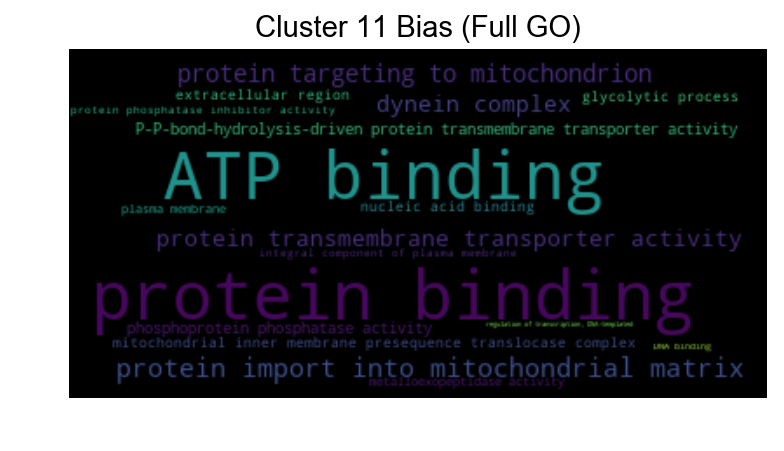

In [188]:
ax = go_wordcloud(full)
ax.set_title('Cluster 11 Bias (Full GO)')

In [189]:
apop = []
for x in full:
    if re.search('autopha', x.name):
        print(x.name)
        apop.extend([nbconfig.fbgn2symbol[y] for y in x.study_items])

print(sorted(list(set(apop))))

[]


In [190]:
sperm = []
for x in full:
    if re.search('sperm', x.name):
        print(x.name)
        sperm.extend([nbconfig.fbgn2symbol[y] for y in x.study_items])

print(sorted(list(set(sperm))))

[]


### Full Gonia

In [200]:
full = run_fly(gonia, background, cutoff=0.05)

fisher module not installed.  Falling back on scipy.stats.fisher_exact
11,166 out of 14,476 population items found in association
Calculating uncorrected p-values using fisher_scipy_stats
   544 out of    565 study items found in association
Running multitest correction: statsmodels fdr_bh
  1,806 GO terms are associated with 544 of 565 study items
  7,609 GO terms are associated with 11,166 of 14,476 population items


GO:0032543 mitochondrial translation 20
GO:0006458 'de novo' protein folding 8
GO:0061077 chaperone-mediated protein folding 11
GO:0000027 ribosomal large subunit assembly 8
GO:0000028 ribosomal small subunit assembly 7
GO:0000278 mitotic cell cycle 18
GO:0042254 ribosome biogenesis 7
GO:0000470 maturation of LSU-rRNA 7
GO:0034126 positive regulation of MyD88-dependent toll-like receptor signaling pathway 5
GO:0035071 salivary gland cell autophagic cell death 13
GO:0000381 regulation of alternative mRNA splicing, via spliceosome 13
GO:0045927 positive regulation of growth 6
GO:0042273 ribosomal large subunit biogenesis 6
GO:0016246 RNA interference 8
GO:0070868 heterochromatin organization involved in chromatin silencing 7
GO:0034453 microtubule anchoring 3
GO:1900182 positive regulation of protein localization to nucleus 3
GO:0006413 translational initiation 9
GO:0006342 chromatin silencing 8
GO:0000956 nuclear-transcribed mRNA catabolic process 4
GO:0006414 translational elongation 5

Text(0.5,1,'Gonia/Cyte Bias (Full GO)')

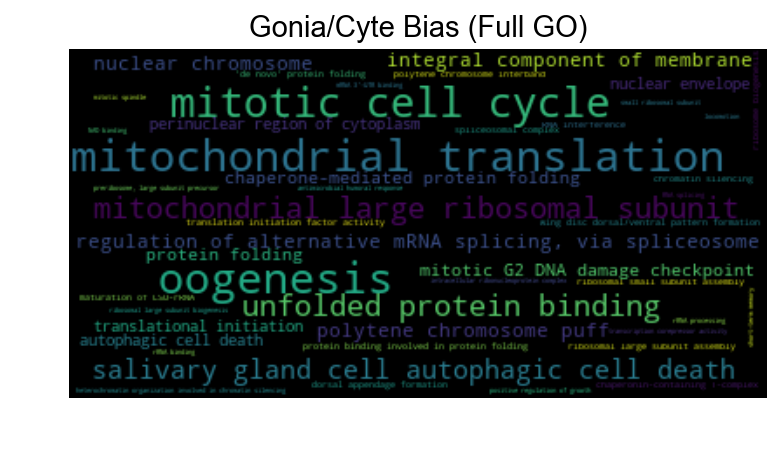

In [201]:
ax = go_wordcloud(full)
ax.set_title('Gonia/Cyte Bias (Full GO)')

In [202]:
apop = []
for x in full:
    if re.search('autopha', x.name):
        print(x.name)
        apop.extend([nbconfig.fbgn2symbol[y] for y in x.study_items])

print(sorted(list(set(apop))))

salivary gland cell autophagic cell death
autophagic cell death
['Akap200', 'Cam', 'Cp1', 'CtsB1', 'NAT1', 'Obp99b', 'Trf2', 'bun', 'cathD', 'ctp', 'eEF5', 'eIF3f1', 'hdc']


In [204]:
sperm = []
for x in full:
    if re.search('sperm', x.name):
        print(x.name)
        sperm.extend([nbconfig.fbgn2symbol[y] for y in x.study_items])

print(sorted(list(set(sperm))))

[]


### Slim Cluster 11

In [191]:
slim = run_flyslim(clus11, background, cutoff=0.05)

fisher module not installed.  Falling back on scipy.stats.fisher_exact
11,166 out of 14,476 population items found in association
Calculating uncorrected p-values using fisher_scipy_stats
   756 out of    968 study items found in association
Running multitest correction: statsmodels fdr_bh
  118 GO terms are associated with 756 of 968 study items
  143 GO terms are associated with 11,166 of 14,476 population items


GO:0007165 signal transduction 14
GO:0009058 biosynthetic process 20
GO:0006629 lipid metabolic process 5
GO:0016192 vesicle-mediated transport 13
GO:0030154 cell differentiation 1
GO:0006259 DNA metabolic process 4
GO:0006810 transport 11
GO:0007267 cell-cell signaling 7
GO:0048870 cell motility 5
GO:0002376 immune system process 4
GO:0040007 growth 3
GO:0050877 nervous system process 17
GO:0006790 sulfur compound metabolic process 1
GO:0006412 translation 4
GO:0006397 mRNA processing 6
GO:0051301 cell division 2
GO:0006520 cellular amino acid metabolic process 2
GO:0022607 cellular component assembly 14
GO:0006399 tRNA metabolic process 1
GO:0000278 mitotic cell cycle 3
GO:0007005 mitochondrion organization 15
GO:0007155 cell adhesion 3
GO:0008219 cell death 4
GO:0006091 generation of precursor metabolites and energy 19
GO:0048646 anatomical structure formation involved in morphogenesis 14
GO:0006605 protein targeting 11
GO:0007010 cytoskeleton organization 15
GO:0051276 chromosome o

Text(0.5,1,'Cluster 11 Bias (Slim GO)')

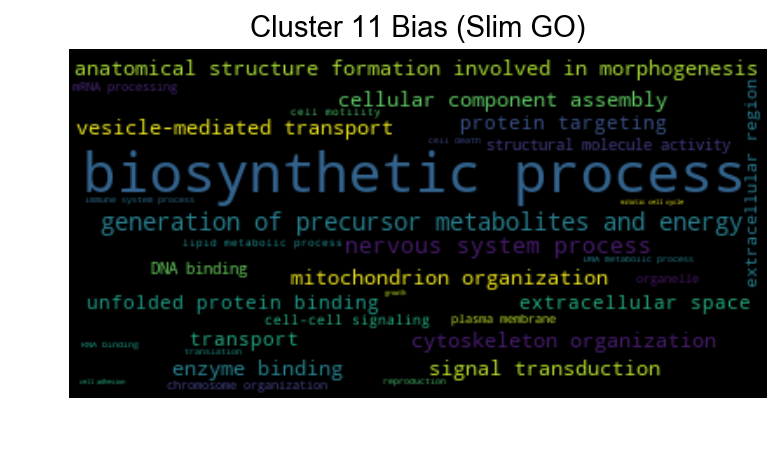

In [192]:
ax = go_wordcloud(slim)
ax.set_title('Cluster 11 Bias (Slim GO)')

In [193]:
apop = []
for x in slim:
    if x.name == 'cell death':
        apop.extend([nbconfig.fbgn2symbol[y] for y in x.study_items])

print(sorted(list(set(apop))))

['BI-1', 'Idh3b', 'eIF4E5', 'emp']


In [194]:
sperm = []
for x in slim:
    if re.search('sperm', x.name):
        sperm.extend([nbconfig.fbgn2symbol[y] for y in x.study_items])

print(sorted(list(set(sperm))))

[]


### Slim Gonia

In [195]:
slim = run_flyslim(gonia, background, cutoff=0.05)

fisher module not installed.  Falling back on scipy.stats.fisher_exact
11,166 out of 14,476 population items found in association
Calculating uncorrected p-values using fisher_scipy_stats
   544 out of    565 study items found in association
Running multitest correction: statsmodels fdr_bh
  128 GO terms are associated with 544 of 565 study items
  143 GO terms are associated with 11,166 of 14,476 population items


GO:0006457 protein folding 20
GO:0042254 ribosome biogenesis 7
GO:0008219 cell death 19
GO:0006913 nucleocytoplasmic transport 13
GO:0034655 nucleobase-containing compound catabolic process 12
GO:0065003 macromolecular complex assembly 7
GO:0051276 chromosome organization 17
GO:0009790 embryo development 7
GO:0007005 mitochondrion organization 10
GO:0000228 nuclear chromosome 14
GO:0005635 nuclear envelope 9
GO:0005576 extracellular region 5
GO:0005768 endosome 0
GO:0019843 rRNA binding 12
GO:0051082 unfolded protein binding 14
GO:0008135 translation factor activity, RNA binding 13
GO:0004871 signal transducer activity 3
GO:0016853 isomerase activity 11
GO:0022857 transmembrane transporter activity 11
GO:0042393 histone binding 6
GO:0016874 ligase activity 10
GO:0008134 transcription factor binding 12


Text(0.5,1,'Gonia/Cyte Bias (Slim GO)')

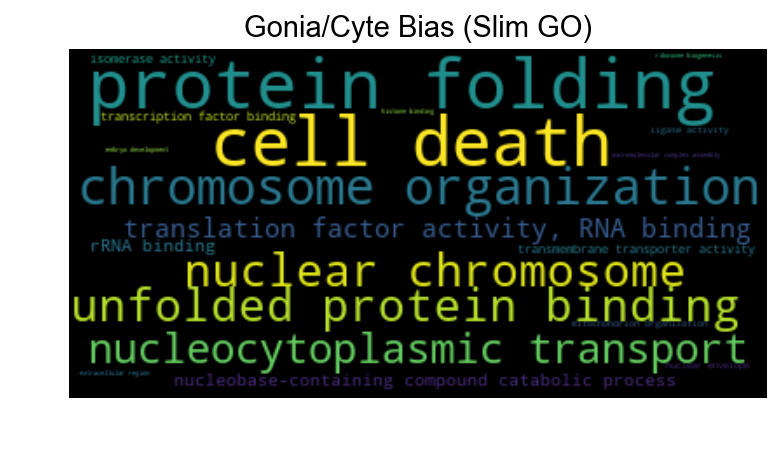

In [196]:
ax = go_wordcloud(slim)
ax.set_title('Gonia/Cyte Bias (Slim GO)')

In [197]:
for x in slim:
    if x.name == 'cell death':
        apop = sorted([nbconfig.fbgn2symbol[y] for y in x.study_items])

print(apop)

['Akap200', 'Cam', 'Cp1', 'CtsB1', 'NAT1', 'Obp99b', 'Trf2', 'Uba1', 'bun', 'cathD', 'chrb', 'ctp', 'eEF5', 'eIF3f1', 'hdc', 'lola', 'mRpS29', 'mbl', 'shi']


In [199]:
sperm = []
for x in slim:
    if re.search('sperm', x.name):
        sperm.extend([nbconfig.fbgn2symbol[y] for y in x.study_items])

print(sorted(list(set(sperm))))

[]


'cell death'